<a href="https://colab.research.google.com/github/TranDuyNgocBao/detectron2_clothing/blob/main/detectron_segmentation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import json
import os
import random
import cv2

# print(f"pandas version: {pd.__version__}")
# print(f"numpy version: {np.__version__}")

In [2]:
# Training dataset
train_df = pd.read_csv('/content/drive/MyDrive/Dataset_ALL/imaterialist_test/train_1_row_10000.csv')
train_df.head()

,Unnamed: 0,ImageId,EncodedPixels,Height,Width,ClassId,AttributesIds
0,10000,0789a60b931c07f397061ea1fb9d74fe,1573522 1 1576520 3 1579518 5 1582516 6 158551...,3000,2041,31,"160,204"
1,10001,0789a60b931c07f397061ea1fb9d74fe,3058664 2 3061663 4 3064662 6 3067660 9 307065...,3000,2041,31,"160,204"
2,10002,0789a60b931c07f397061ea1fb9d74fe,2854459 4 2857458 11 2860457 15 2863456 17 286...,3000,2041,32,219
3,10003,0789a60b931c07f397061ea1fb9d74fe,1573522 1 1576520 3 1579518 4 1582516 6 158551...,3000,2041,4,"17,115,147,225,281,311,317"
4,10004,0789a60b931c07f397061ea1fb9d74fe,2665076 3 2668072 7 2671067 12 2674062 18 2677...,3000,2041,32,219


In [3]:
# Get datasets shapes
print(f'Training dataset shape: {train_df.shape}')
print(f'Unique images training: {train_df["ImageId"].nunique()}')

Training dataset shape: (10000, 7)
Unique images training: 1381


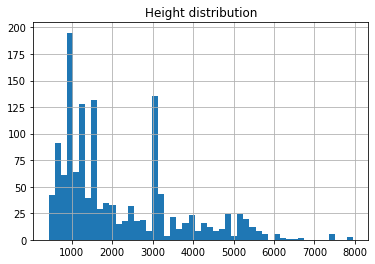

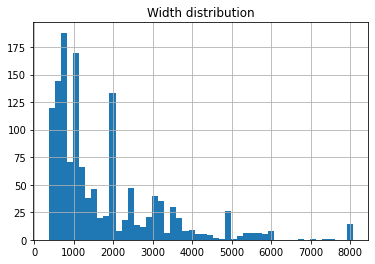

In [4]:
# Get image size distribution
shape_df = train_df.groupby("ImageId")[["Height", "Width"]].first()
for dim in ["Height", "Width"]:
    plt.figure()
    plt.hist(shape_df[dim], bins=50)
    plt.grid()
    plt.title(f"{dim} distribution")

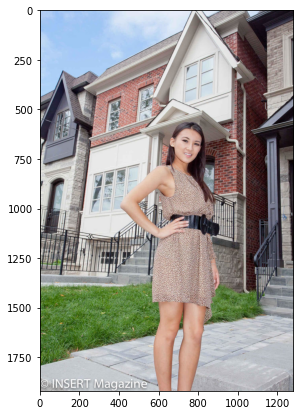

In [ ]:
# Plot randomly selected image
plt.figure(figsize=(70,7))
random_image = train_df.sample()["ImageId"].item()
plt.imshow(mpimg.imread(f'/content/drive/MyDrive/Dataset_ALL/imaterialist_test/small_train/{random_image}.jpg'))
plt.grid(False)
plt.show()

In [5]:
# Get label file
with open('/content/drive/MyDrive/Dataset_ALL/imaterialist_test/label_descriptions.json', 'r') as file:
    label_d = json.load(file)

print("Label description columns {}".format(list(label_d.keys())))

Label description columns ['categories', 'attributes']


In [6]:
# Separate label description into categories and attributes
categories_df = pd.DataFrame(label_d['categories'])
attributes_df = pd.DataFrame(label_d['attributes'])

In [ ]:
categories_df

,id,name,supercategory,level
0,0,"shirt, blouse",upperbody,2
1,1,"top, t-shirt, sweatshirt",upperbody,2
2,2,sweater,upperbody,2
3,3,cardigan,upperbody,2
4,4,jacket,upperbody,2
5,5,vest,upperbody,2
6,6,pants,lowerbody,2
7,7,shorts,lowerbody,2
8,8,skirt,lowerbody,2
9,9,coat,wholebody,2


In [ ]:
attributes_df

,id,name,supercategory,level
0,0,classic (t-shirt),nickname,1
1,1,polo (shirt),nickname,1
2,2,undershirt,nickname,1
3,3,henley (shirt),nickname,1
4,4,ringer (t-shirt),nickname,1
...,...,...,...,...
289,336,peacock,animal,2
290,337,zebra,animal,2
291,338,giraffe,animal,2
292,339,toile de jouy,textile pattern,1


In [7]:
# make all categories stored by one variables
categ_names = categories_df["name"].unique()
print(categ_names)
print(f"Number of attributes {len(categ_names)}")

['shirt, blouse' 'top, t-shirt, sweatshirt' 'sweater' 'cardigan' 'jacket'
 'vest' 'pants' 'shorts' 'skirt' 'coat' 'dress' 'jumpsuit' 'cape'
 'glasses' 'hat' 'headband, head covering, hair accessory' 'tie' 'glove'
 'watch' 'belt' 'leg warmer' 'tights, stockings' 'sock' 'shoe'
 'bag, wallet' 'scarf' 'umbrella' 'hood' 'collar' 'lapel' 'epaulette'
 'sleeve' 'pocket' 'neckline' 'buckle' 'zipper' 'applique' 'bead' 'bow'
 'flower' 'fringe' 'ribbon' 'rivet' 'ruffle' 'sequin' 'tassel']
Number of attributes 46


In [8]:
# make all attributes stored by one variables
attr_names = attributes_df["name"].unique()
print(attr_names)
print(f"Number of attributes {len(attr_names)}")

['classic (t-shirt)' 'polo (shirt)' 'undershirt' 'henley (shirt)'
 'ringer (t-shirt)' 'raglan (t-shirt)' 'rugby (shirt)' 'sailor (shirt)'
 'crop (top)' 'halter (top)' 'camisole' 'tank (top)' 'peasant (top)'
 'tube (top)' 'tunic (top)' 'smock (top)' 'hoodie' 'blazer' 'pea (jacket)'
 'puffer (jacket)' 'biker (jacket)' 'trucker (jacket)' 'bomber (jacket)'
 'anorak' 'safari (jacket)' 'mao (jacket)' 'nehru (jacket)'
 'norfolk (jacket)' 'classic military (jacket)' 'track (jacket)'
 'windbreaker' 'chanel (jacket)' 'bolero' 'tuxedo (jacket)'
 'varsity (jacket)' 'crop (jacket)' 'jeans' 'sweatpants' 'leggings'
 'hip-huggers (pants)' 'cargo (pants)' 'culottes' 'capri (pants)'
 'harem (pants)' 'sailor (pants)' 'jodhpur' 'peg (pants)' 'camo (pants)'
 'track (pants)' 'crop (pants)' 'short (shorts)' 'booty (shorts)'
 'bermuda (shorts)' 'cargo (shorts)' 'trunks' 'boardshorts' 'skort'
 'roll-up (shorts)' 'tie-up (shorts)' 'culotte (shorts)' 'lounge (shorts)'
 'bloomers' 'tutu (skirt)' 'kilt' 'wrap (ski

In [9]:
# Create dictionaries to map the IDs with the category and attributes strings
cat_map = {category["id"]: category["name"] for category in label_d['categories']}
cat_map_inv = {category["name"]: category["id"] for category in label_d['categories']}

attr_map = {category["id"]: category["name"] for category in label_d['attributes']}
attr_map_inv = {category["name"]: category["id"] for category in label_d['attributes']}

In [ ]:
cat_map

{0: 'shirt, blouse',
 1: 'top, t-shirt, sweatshirt',
 2: 'sweater',
 3: 'cardigan',
 4: 'jacket',
 5: 'vest',
 6: 'pants',
 7: 'shorts',
 8: 'skirt',
 9: 'coat',
 10: 'dress',
 11: 'jumpsuit',
 12: 'cape',
 13: 'glasses',
 14: 'hat',
 15: 'headband, head covering, hair accessory',
 16: 'tie',
 17: 'glove',
 18: 'watch',
 19: 'belt',
 20: 'leg warmer',
 21: 'tights, stockings',
 22: 'sock',
 23: 'shoe',
 24: 'bag, wallet',
 25: 'scarf',
 26: 'umbrella',
 27: 'hood',
 28: 'collar',
 29: 'lapel',
 30: 'epaulette',
 31: 'sleeve',
 32: 'pocket',
 33: 'neckline',
 34: 'buckle',
 35: 'zipper',
 36: 'applique',
 37: 'bead',
 38: 'bow',
 39: 'flower',
 40: 'fringe',
 41: 'ribbon',
 42: 'rivet',
 43: 'ruffle',
 44: 'sequin',
 45: 'tassel'}

### Plot segmented images

In [10]:
def plot_raw_segmented_image(df, figsize=(15,15)):
    # Read random image
    random_id = df.sample()["ImageId"].item()
    image = mpimg.imread(f'/content/drive/MyDrive/Dataset_ALL/imaterialist_test/small_train/{random_id}.jpg')
    shape = image.shape,
    encoded_pixels = df[train_df['ImageId'] == random_id]['EncodedPixels']
    class_ids = df[train_df['ImageId'] == random_id]['ClassId']
    
    # Create mask
    height, width = shape[0][:2]
    mask = np.zeros((height, width)).reshape(-1)
    for pixels, class_id in zip(encoded_pixels, class_ids):
        pixels_split = list(map(int, pixels.split()))
        pixel_starts = pixels_split[::2]
        run_lengths = pixels_split[1::2]
        for pixel_start, run_length in zip(pixel_starts, run_lengths):
            mask[pixel_start:pixel_start + run_length] = 255 - int(class_id) * 4
    mask = mask.reshape(height, width, order='F')    
    
    # Plot images
    fig, axs = plt.subplots(1, 2,figsize=(15,15))
    axs[0].imshow(image)    
    axs[1].imshow(image)    
    axs[1].imshow(mask, alpha=0.8)
    plt.show()

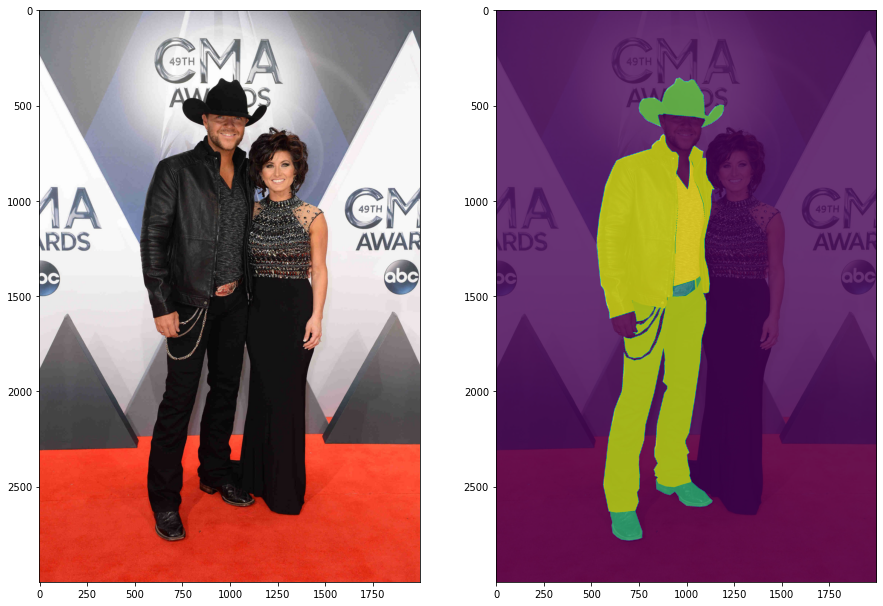

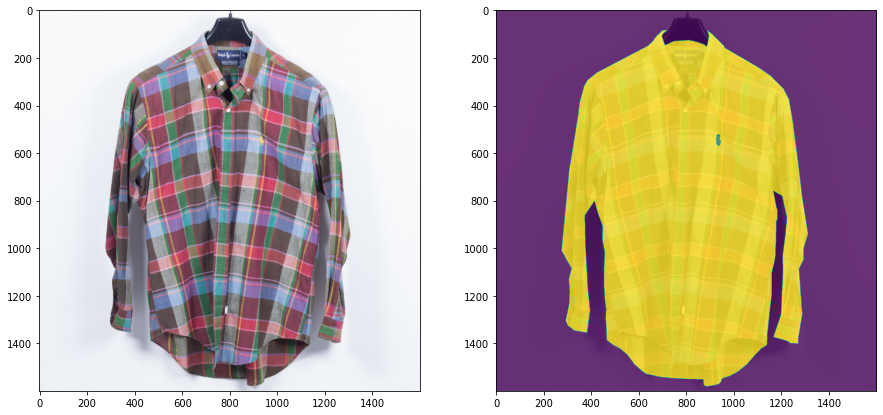

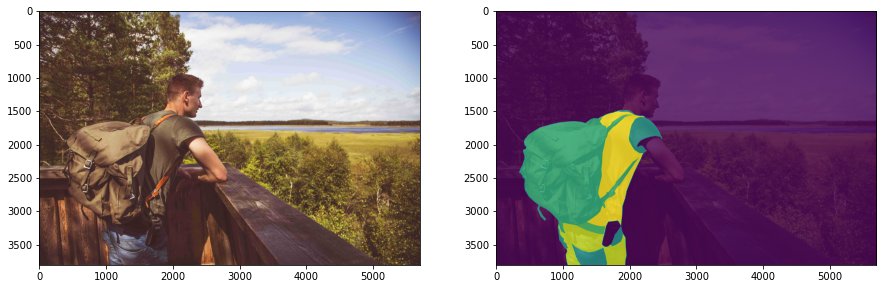

In [ ]:
# Plot raw and segmented images
size = 3
for _ in range(size):
    plot_raw_segmented_image(train_df, "ImageId")

In [11]:
def plot_classes_image(df, figsize=(15,15)):
    # Select random image
    random_id = df.sample()["ImageId"].item()
    image = mpimg.imread(f'/content/drive/MyDrive/Dataset_ALL/imaterialist_test/small_train/{random_id}.jpg')
    shape = image.shape,
    encoded_pixels = df[train_df['ImageId'] == random_id]['EncodedPixels']
    class_ids = df[train_df['ImageId'] == random_id]['ClassId']
    
    # Create mask and plot every specific class in the image
    height, width = shape[0][:2]
    for pixels, class_id in zip(encoded_pixels, class_ids):
        mask = np.zeros((height, width)).reshape(-1)
        pixels_split = list(map(int, pixels.split()))
        pixel_starts = pixels_split[::2]
        run_lengths = pixels_split[1::2]
        for pixel_start, run_length in zip(pixel_starts, run_lengths):
            mask[pixel_start:pixel_start + run_length] = 255 - int(class_id) * 4
        mask = mask.reshape(height, width, order='F')
        
        # Plot masked image
        plt.figure(figsize=(15, 15))
        title_raw = cat_map[int(class_id)]
        plt.title(title_raw)
        plt.imshow(image)    
        plt.imshow(mask, alpha=0.8)
        plt.show()

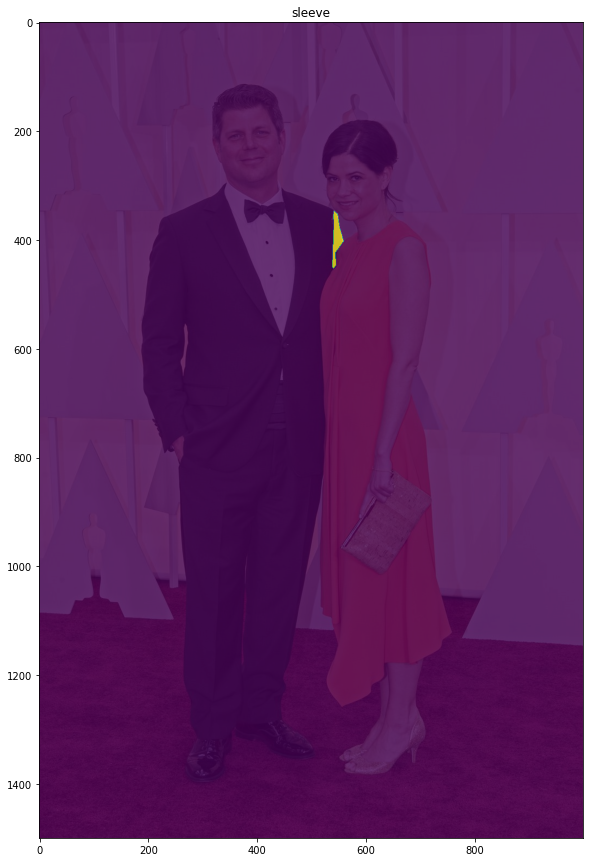

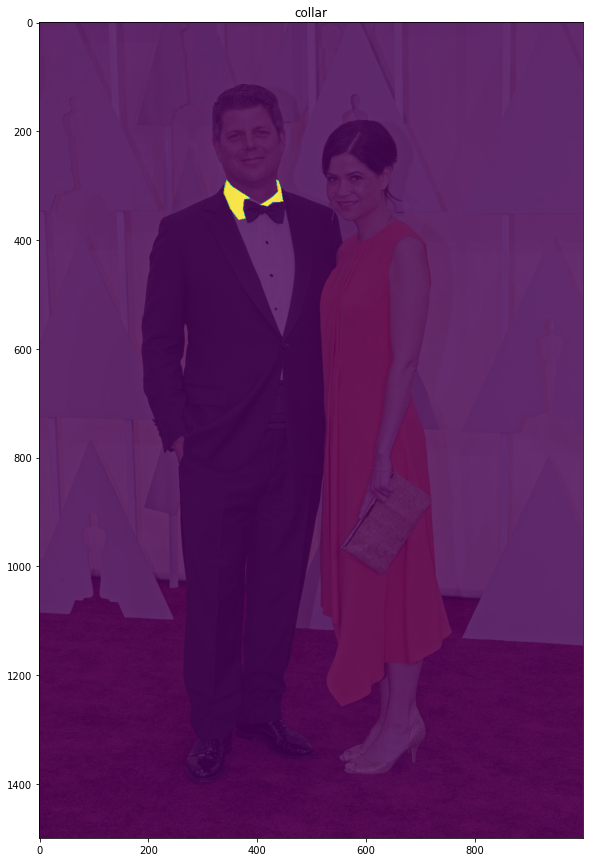

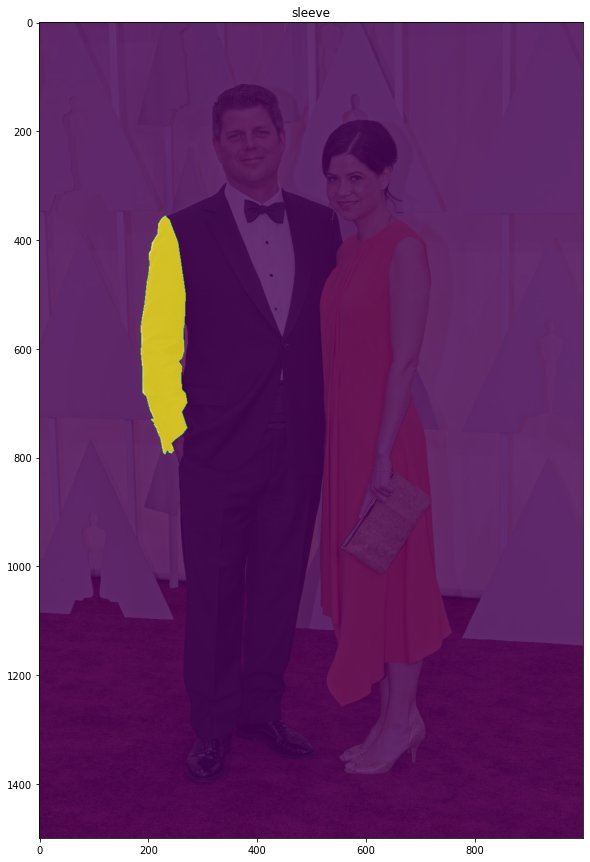

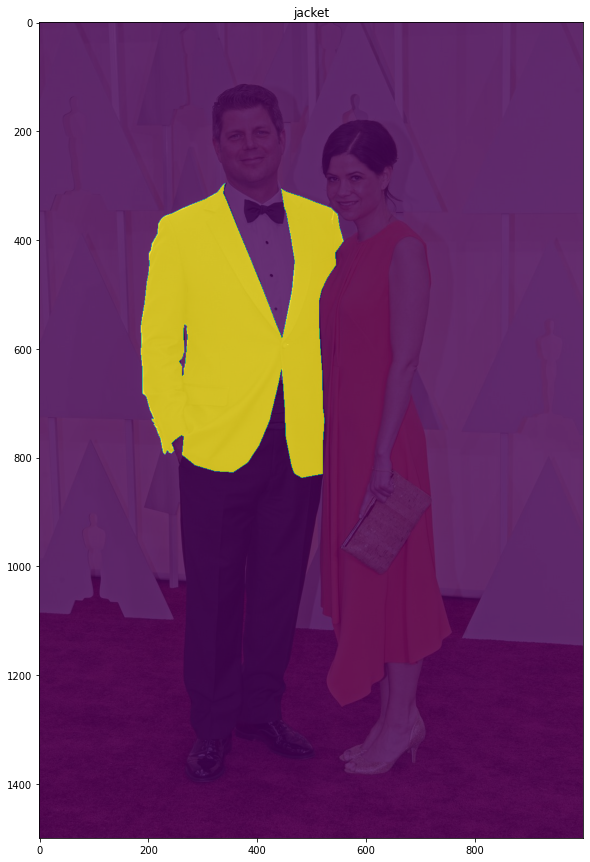

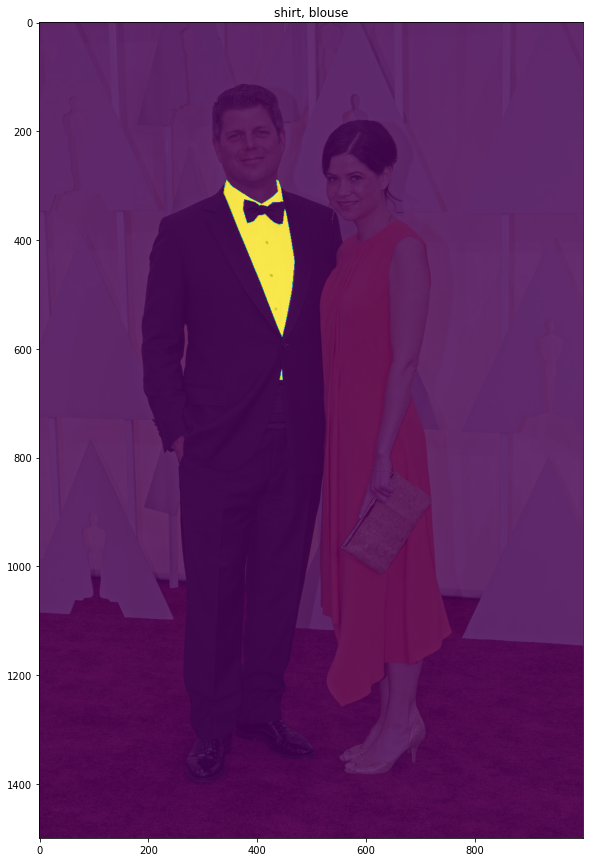

...

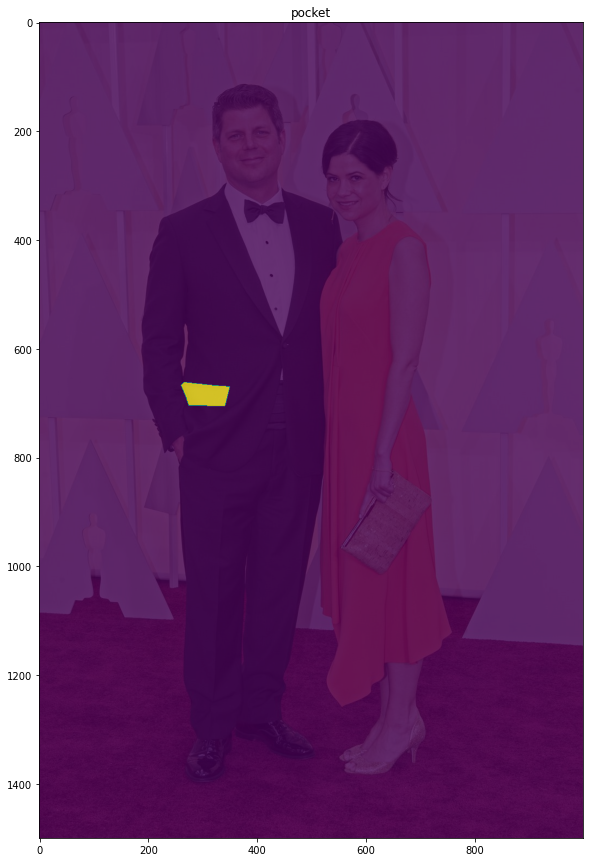

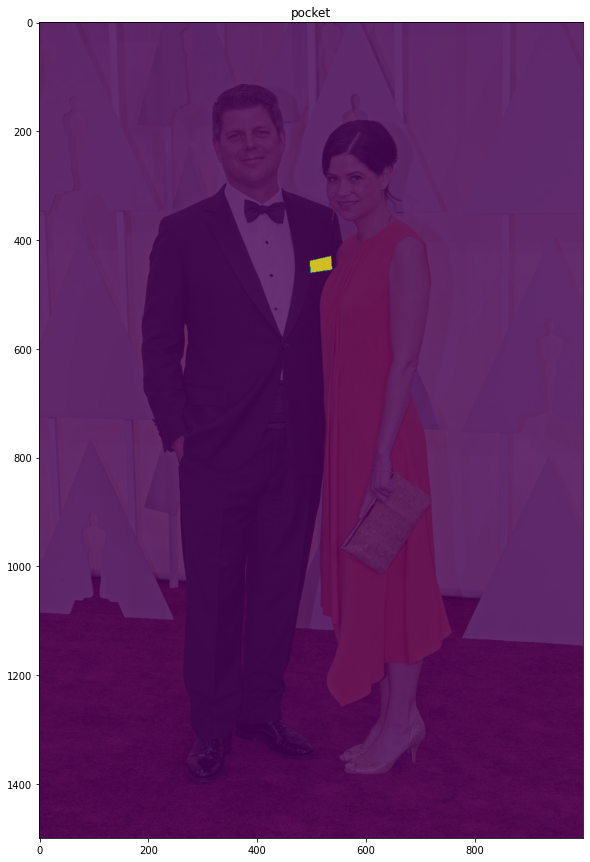

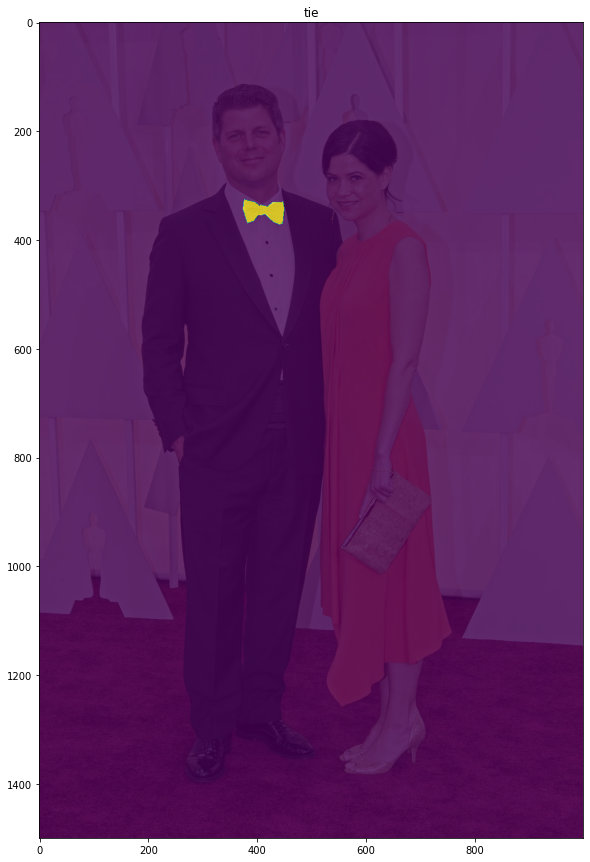

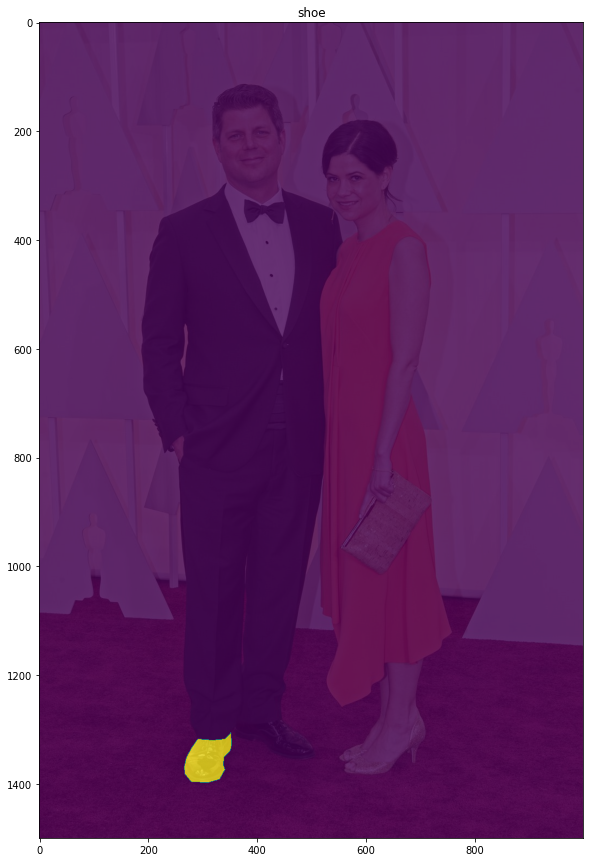

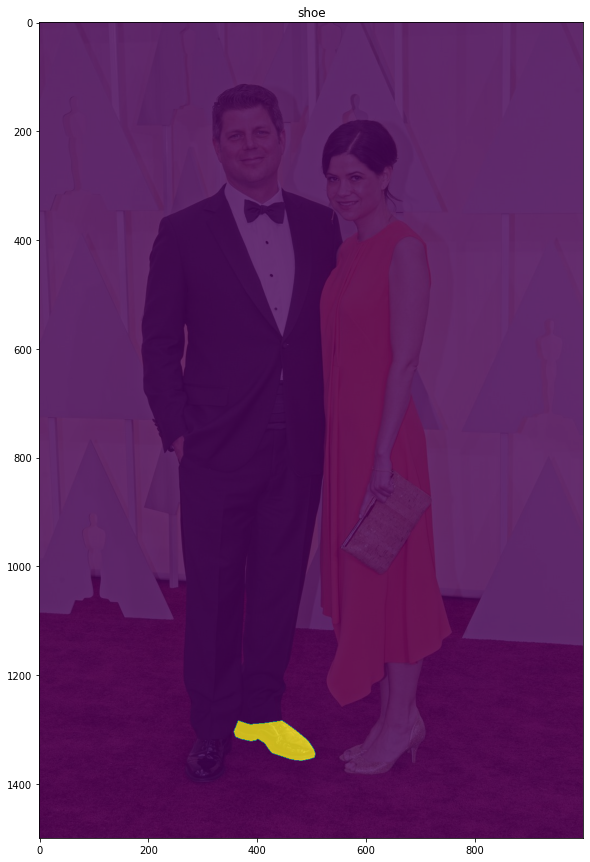

In [ ]:
plot_classes_image(train_df)

# Detectron

In [ ]:
!pip install -q cython pyyaml

In [ ]:
!pip install pycocotools==2.0.2

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Created wheel for pycocotools: filename=pycocotools-2.0.2-cp37-cp37m-linux_x86_64.whl size=265269 sha256=d032eedee0b8740761a9172d0f26843a1f8fcc5e59c25092060a5600c007bf92
  Stored in directory: /root/.cache/pip/wheels/bc/cf/1b/e95c99c5f9d1648be3f500ca55e7ce55f24818b0f48336adaf
Successfully built pycocotools
  Attempting uninstall: pycocotools
    Found existing installation: pycocotools 2.0.6
    Uninstalling pycocotools-2.0.6:
      Successfully uninstalled pycocotools-2.0.6


In [ ]:
!pip install 'git+https://github.com/facebookresearch/detectron2.git'

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Cloning https://github.com/facebookresearch/detectron2.git to /tmp/pip-req-build-9dby4s4t
  Running command git clone -q https://github.com/facebookresearch/detectron2.git /tmp/pip-req-build-9dby4s4t
     |████████████████████████████████| 50 kB 6.1 MB/s 
     |████████████████████████████████| 79 kB 4.2 MB/s 
     |████████████████████████████████| 151 kB 51.0 MB/s 
     |████████████████████████████████| 1.4 MB 45.2 MB/s 
     |████████████████████████████████| 548 kB 27.9 MB/s 
     |████████████████████████████████| 248 kB 69.0 MB/s 
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Installing backend dependencies ... done
    Preparing wheel metadata ... done
     |████████████████████████████████| 843 kB 47.9 MB/s 
     |████████████████████████████████| 96 kB 6.7 MB/s 
     |████████████████████████████████| 117 kB 74.9 MB/s 
     |████████

## make libararies

In [12]:
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog
from detectron2.structures import BoxMode

## Use detectron in current dataset

In [13]:
# Use detectron to predict images in the current dataset,
# use the default weights and labels from the network
config_file = "COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file(config_file))
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url(config_file)

predictor = DefaultPredictor(cfg)

/usr/local/lib/python3.7/dist-packages/torch/functional.py:478: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ../aten/src/ATen/native/TensorShape.cpp:2894.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


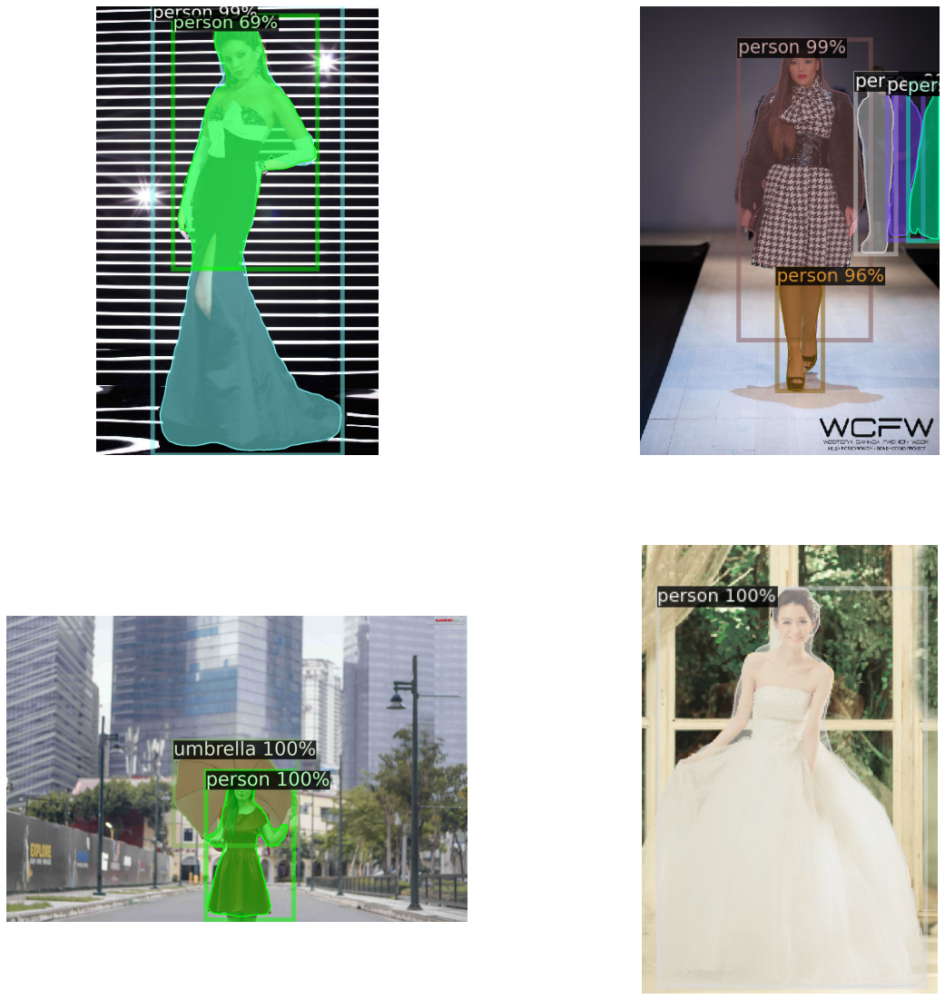

In [13]:
# Plot images classified by the pretrained detectron
rows, cols = 2, 2
plt.figure(figsize=(20, 20))

for i in range(int(rows * cols)):
    plt.subplot(rows, cols, i + 1)
    
    # Get random image
    random_id = train_df.sample()["ImageId"].item()
    im = mpimg.imread(f'/content/drive/MyDrive/Dataset_ALL/imaterialist_test/small_train/{random_id}.jpg')
    height, width = im.shape[:2]
    
    # Get detectron prediction from the selected image
    outputs = predictor(im)
    
    # Create visualizer
    visualizer = Visualizer(im[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=0.4)
    
    # Change font size for better reading
    visualizer._default_font_size = np.sqrt(height * width) // 20
    visualizer = visualizer.draw_instance_predictions(outputs["instances"].to("cpu"))
    
    # Plot images
    plt.axis('off')
    plt.imshow(visualizer.get_image()[:, :, ::-1])

plt.show()

## Modify dataset to use detectron

In [14]:
def rle_decode_string(string, h, w):
    """
    Transforms rle string into a pixel mask
    
    :param string: rle string to transform into mask
    :type string: str
    :param string: image height
    :type string: int
    :param string: image width
    :type string: int
    :return: image mask
    :rtype: numpy array

    """
    mask = np.full(h * w, 0, dtype=np.uint8)
    annotation = [int(x) for x in string.split(' ')]
    for i, start_pixel in enumerate(annotation[::2]):
        mask[start_pixel: start_pixel + annotation[2 * i + 1]] = 1
    mask = mask.reshape((h, w), order='F')
    return mask

def rle2bbox(rle, shape):
    '''
    Get a bbox from a mask which is required for Detectron 2 dataset
    :param rle: run-length encoded image mask, as string
    :type rle: str
    :param shape: (height, width) of image on which RLE was produced
    :type rle: tuple
    :return: (x0, y0, x1, y1) tuple describing the bounding box of the rle mask
    :rtype: tuple
    '''
    
    a = np.fromiter(rle.split(), dtype=np.uint)
    a = a.reshape((-1, 2))  # an array of (start, length) pairs
    a[:,0] -= 1  # `start` is 1-indexed
    
    y0 = a[:,0] % shape[0]
    y1 = y0 + a[:,1]
    if np.any(y1 > shape[0]):
        # got `y` overrun, meaning that there are a pixels in mask on 0 and shape[0] position
        y0 = 0
        y1 = shape[0]
    else:
        y0 = np.min(y0)
        y1 = np.max(y1)
    
    x0 = a[:,0] // shape[0]
    x1 = (a[:,0] + a[:,1]) // shape[0]
    x0 = np.min(x0)
    x1 = np.max(x1)
    
    if x1 > shape[1]:
        # just went out of the image dimensions
        raise ValueError("invalid RLE or image dimensions: x1=%d > shape[1]=%d" % (
            x1, shape[1]
        ))

    return x0, y0, x1, y1

In [15]:
# Transform ImageId into image path
image_dir = '/content/drive/MyDrive/Dataset_ALL/imaterialist_test/small_train/'
train_df['ImageId'] = image_dir + train_df['ImageId'] + '.jpg'
train_df.head()

,Unnamed: 0,ImageId,EncodedPixels,Height,Width,ClassId,AttributesIds
0,10000,/content/drive/MyDrive/Dataset_ALL/imaterialis...,1573522 1 1576520 3 1579518 5 1582516 6 158551...,3000,2041,31,"160,204"
1,10001,/content/drive/MyDrive/Dataset_ALL/imaterialis...,3058664 2 3061663 4 3064662 6 3067660 9 307065...,3000,2041,31,"160,204"
2,10002,/content/drive/MyDrive/Dataset_ALL/imaterialis...,2854459 4 2857458 11 2860457 15 2863456 17 286...,3000,2041,32,219
3,10003,/content/drive/MyDrive/Dataset_ALL/imaterialis...,1573522 1 1576520 3 1579518 4 1582516 6 158551...,3000,2041,4,"17,115,147,225,281,311,317"
4,10004,/content/drive/MyDrive/Dataset_ALL/imaterialis...,2665076 3 2668072 7 2671067 12 2674062 18 2677...,3000,2041,32,219


In [16]:
train_df['ImageId'][0]

'/content/drive/MyDrive/Dataset_ALL/imaterialist_test/small_train/0789a60b931c07f397061ea1fb9d74fe.jpg'

In [17]:
# Create boxes list
bboxes = [rle2bbox(c.EncodedPixels, (c.Height, c.Width)) for n, c in train_df.iterrows()]
bboxes_array = np.array(bboxes)

In [18]:
# Fill NaNs
train_df = train_df.fillna(999)

In [19]:
# Add bounding boxes coordinates to train using detectron
train_df['x0'], train_df['y0'], train_df['x1'], train_df['y1'] = bboxes_array[:,0], bboxes_array[:,1], bboxes_array[:,2], bboxes_array[:,3]
train_df.head()

,Unnamed: 0,ImageId,EncodedPixels,Height,Width,ClassId,AttributesIds,x0,y0,x1,y1
0,10000,/content/drive/MyDrive/Dataset_ALL/imaterialis...,1573522 1 1576520 3 1579518 5 1582516 6 158551...,3000,2041,31,"160,204",524,767,721,1570
1,10001,/content/drive/MyDrive/Dataset_ALL/imaterialis...,3058664 2 3061663 4 3064662 6 3067660 9 307065...,3000,2041,31,"160,204",1019,785,1324,1759
2,10002,/content/drive/MyDrive/Dataset_ALL/imaterialis...,2854459 4 2857458 11 2860457 15 2863456 17 286...,3000,2041,32,219,951,1404,1136,1475
3,10003,/content/drive/MyDrive/Dataset_ALL/imaterialis...,1573522 1 1576520 3 1579518 4 1582516 6 158551...,3000,2041,4,"17,115,147,225,281,311,317",524,648,1325,1759
4,10004,/content/drive/MyDrive/Dataset_ALL/imaterialis...,2665076 3 2668072 7 2671067 12 2674062 18 2677...,3000,2041,32,219,888,1027,1044,1082


In [20]:
def transform_to_array(value):
    if isinstance(value, (np.ndarray, np.generic)):
        return value
    elif isinstance(value, str):
        array = [int(val) for val in value.split(",")]
    elif isinstance(value, int):
        array = [999] 
    array = np.array(array)
    return np.pad(array, (0, 14 - len(array)))

In [21]:
# Transform attribute string into tensor
train_df["AttributesIds"] = train_df["AttributesIds"].map(transform_to_array)
train_df.head()

,Unnamed: 0,ImageId,EncodedPixels,Height,Width,ClassId,AttributesIds,x0,y0,x1,y1
0,10000,/content/drive/MyDrive/Dataset_ALL/imaterialis...,1573522 1 1576520 3 1579518 5 1582516 6 158551...,3000,2041,31,"[160, 204, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]",524,767,721,1570
1,10001,/content/drive/MyDrive/Dataset_ALL/imaterialis...,3058664 2 3061663 4 3064662 6 3067660 9 307065...,3000,2041,31,"[160, 204, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]",1019,785,1324,1759
2,10002,/content/drive/MyDrive/Dataset_ALL/imaterialis...,2854459 4 2857458 11 2860457 15 2863456 17 286...,3000,2041,32,"[219, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]",951,1404,1136,1475
3,10003,/content/drive/MyDrive/Dataset_ALL/imaterialis...,1573522 1 1576520 3 1579518 4 1582516 6 158551...,3000,2041,4,"[17, 115, 147, 225, 281, 311, 317, 0, 0, 0, 0,...",524,648,1325,1759
4,10004,/content/drive/MyDrive/Dataset_ALL/imaterialis...,2665076 3 2668072 7 2671067 12 2674062 18 2677...,3000,2041,32,"[219, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]",888,1027,1044,1082


In [22]:
%cd /content/drive/MyDrive
# Store modified train_df
train_df.to_pickle("train_df.pickle")

/content/drive/MyDrive


In [23]:
print(len(train_df))

10000


In [24]:
import pycocotools
def get_materialist_dicts(df):
    """
    Transforms dataframe into dictionary used to train using detectron
    """
    dataset_dicts = []
    for idx, filename in enumerate(df["ImageId"].unique()):
        record = {}
        # Get useful image information
        height, width = df[df["ImageId"] == filename][["Height", "Width"]].values[0]
        record["file_name"] = filename
        record["image_id"] = idx
        record["height"] = int(height)
        record["width"] = int(width)
        
        if idx % 1000 == 0:
            print(idx)
        
        objs = []
        for i, row in df[(df['ImageId'] == filename)].iterrows():
            
            # Get segmentation polygons
            mask = rle_decode_string(row['EncodedPixels'], row['Height'], row['Width'])
            # segmentation = pycocotools.mask.encode(np.asarray(mask, order="F"))
            contours, hierarchy = cv2.findContours((mask).astype(np.uint8), cv2.RETR_TREE,
                                                    cv2.CHAIN_APPROX_SIMPLE)
            segmentation = []

            for contour in contours:
                contour = contour.flatten().tolist()
                if len(contour) > 4:
                    segmentation.append(contour)

            obj = {
                "bbox": [row['x0'], row['y0'], row['x1'], row['y1']],
                "bbox_mode": BoxMode.XYXY_ABS,
                "segmentation": segmentation,
                "category_id": row['ClassId'],
                "attributes": row['AttributesIds'],
                "iscrowd": 0,
            }
            objs.append(obj)
        
        record['annotations'] = objs
        dataset_dicts.append(record)
    return dataset_dicts

# Use reduced dictionary to reduce the time to transform into dictionaries
#df_copy = train_df[:8000].copy()

df_copy = train_df.copy()

df_copy = train_df[:9500].copy()
df_copy_val = train_df[9500:10000].copy()

# Full dictionary
# df_copy = train_df.copy()

materialist_dict = get_materialist_dicts(df_copy)

0
1000


In [25]:
materialist_dict[0].keys()

dict_keys(['file_name', 'image_id', 'height', 'width', 'annotations'])

In [26]:
print(len(df_copy))
print(len(df_copy_val))
print(len(materialist_dict))
print(len(train_df))
print(len(train_df["ImageId"].unique()))
print(len(df_copy["ImageId"].unique()))

9500
500
1317
10000
1381
1317


In [27]:
# Register the custom dataset to detectron2,
for d in ["train", "val"]:
    if d == "train":
        used_df = df_copy
    else:
        used_df = df_copy_val
    DatasetCatalog.register("mat_" + d, lambda df=used_df: get_materialist_dicts(df))
    # DatasetCatalog.register("mat_" + d, lambda df=df_copy: get_materialist_dicts(df))
    MetadataCatalog.get("mat_" + d).set(thing_classes=list(categories_df.name))
materialist_metadata = MetadataCatalog.get("mat_train")

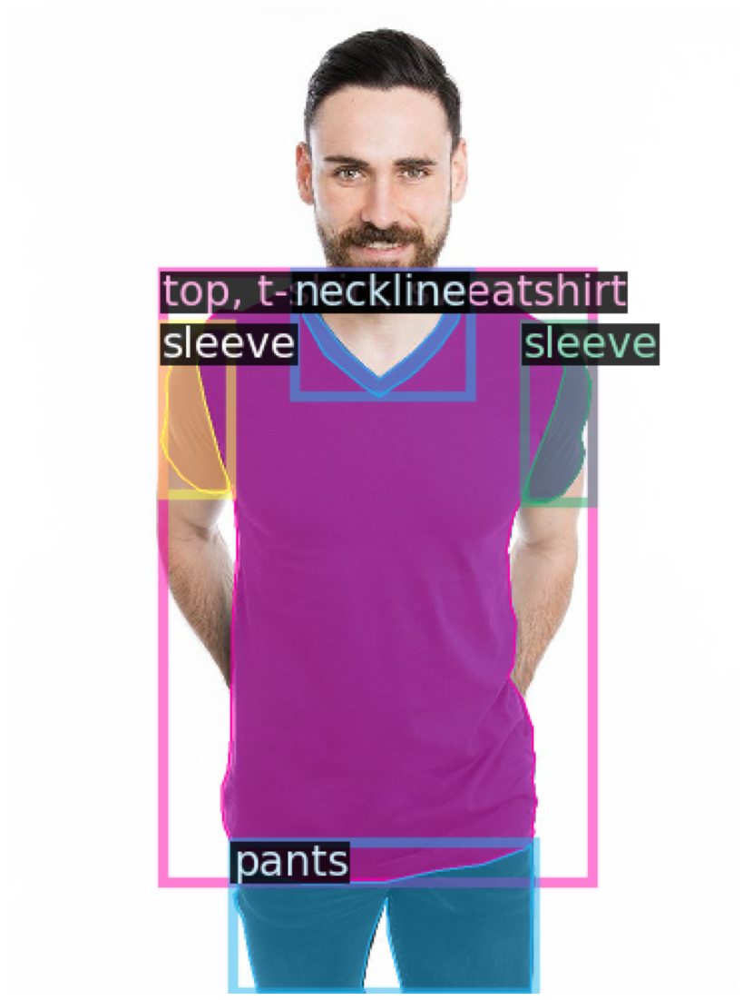

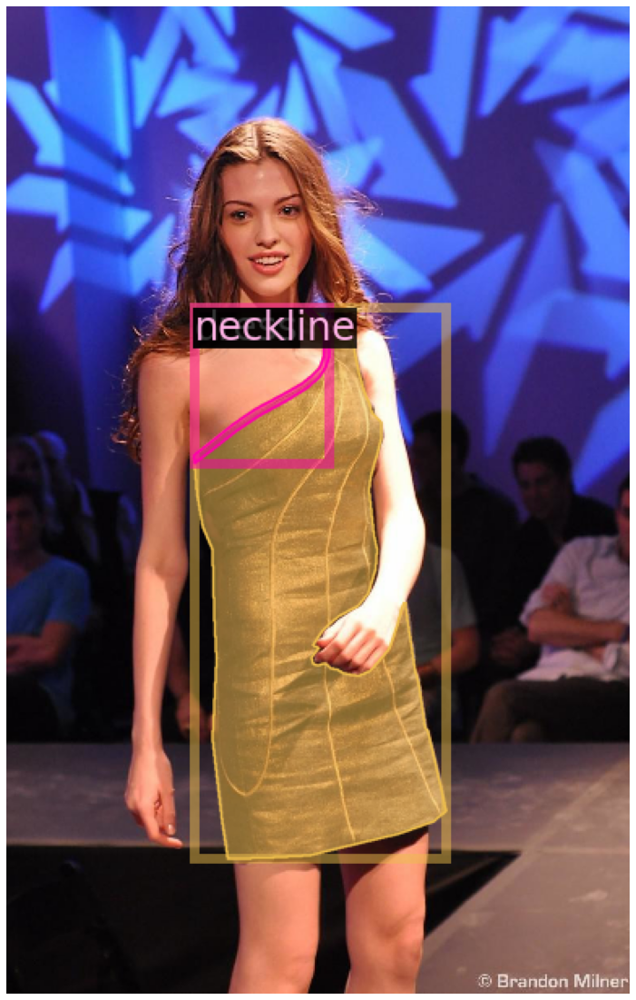

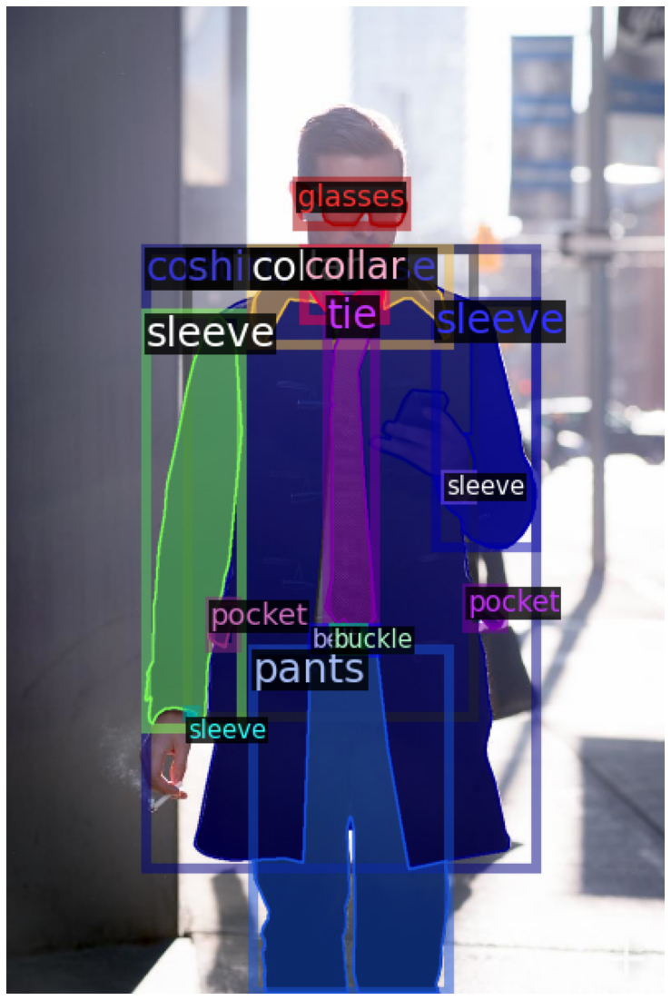

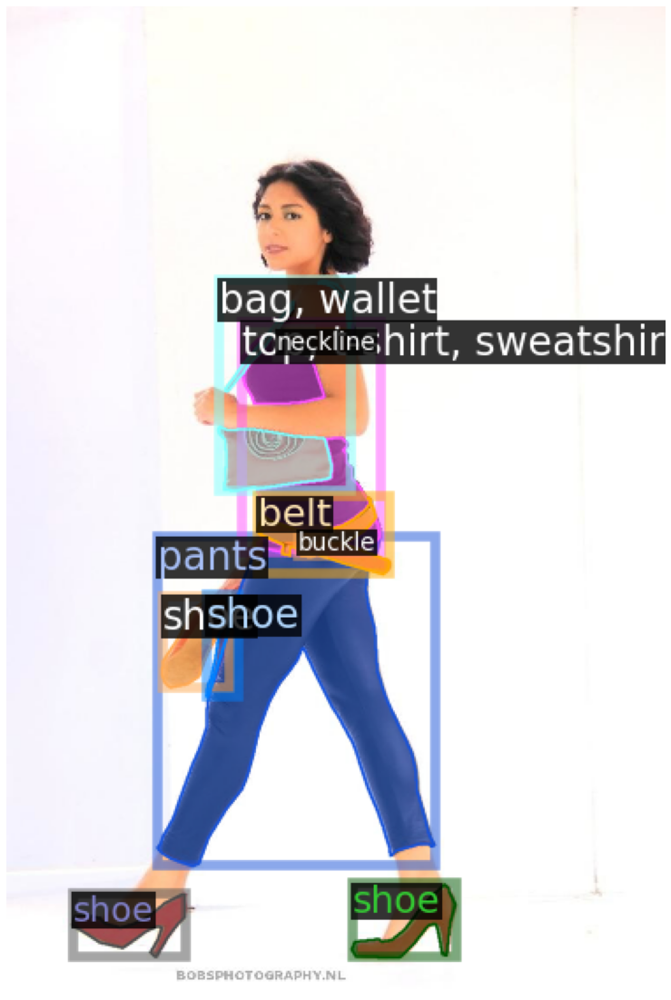

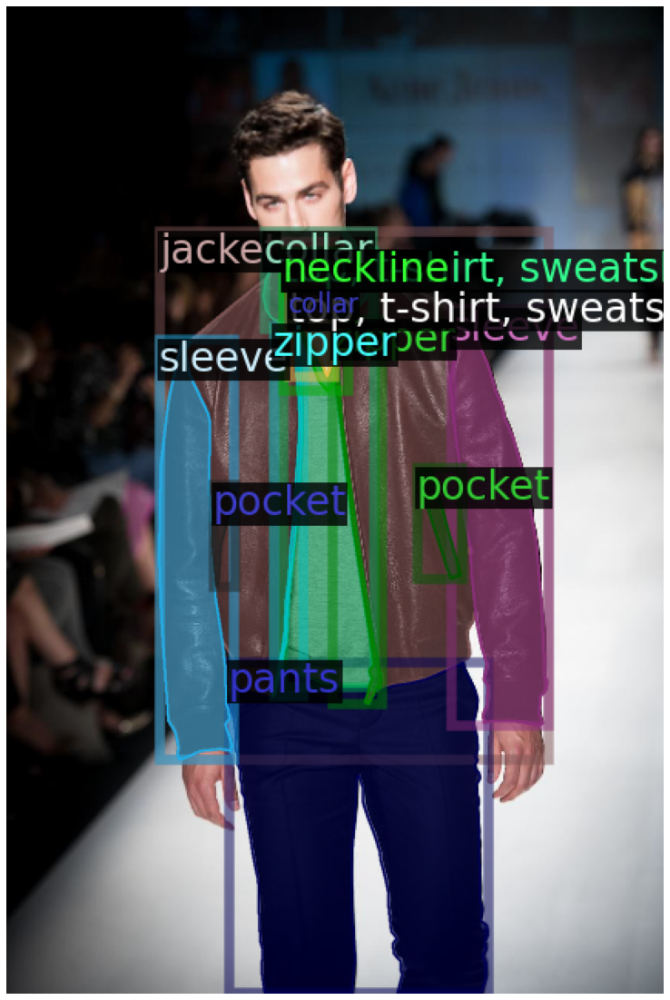

In [28]:
# To verify the data loading is correct we visualize the annotations of randomly selected samples in the training set
for d in random.sample(materialist_dict, 5):
    img = cv2.imread(d["file_name"])
    img = mpimg.imread(d["file_name"])
    height, width = img.shape[:2]
    plt.figure(figsize=(20, 20))
    visualizer = Visualizer(img[:, :, ::-1], metadata=materialist_metadata, scale=0.5)
    visualizer._default_font_size = np.sqrt(height * width) // 20
    out = visualizer.draw_dataset_dict(d)
    plt.imshow(out.get_image()[:, :, ::-1])
    plt.axis('off')
    plt.show()

## FPN

In [29]:
%cd /content/drive/MyDrive
from detectron2.engine import DefaultTrainer
os.environ["CUDA_LAUNCH_BLOCKING"] = "1"

# Fine-tune a COCO-pretrained R50-FPN Mask R-CNN model on the dataset
cfg_FPN = get_cfg()
cfg_FPN.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))
cfg_FPN.DATASETS.TRAIN = ("mat_train",)
cfg_FPN.DATASETS.TEST = ("mat_val",)
cfg_FPN.DATALOADER.NUM_WORKERS = 1
cfg_FPN.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")
cfg_FPN.SOLVER.IMS_PER_BATCH = 2
cfg_FPN.SOLVER.BASE_LR = 0.00025 
cfg_FPN.SOLVER.MAX_ITER = 3  
cfg_FPN.SOLVER.STEPS = []       
cfg_FPN.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128  
cfg_FPN.MODEL.ROI_HEADS.NUM_CLASSES = 46 

# Train
cfg_FPN.OUTPUT_DIR = "./output_FPN"
os.makedirs(cfg_FPN.OUTPUT_DIR, exist_ok=True)
trainer_FPN = DefaultTrainer(cfg_FPN) 
trainer_FPN.resume_or_load(resume=False)
trainer_FPN.train()

/content/drive/MyDrive
[11/19 14:14:31 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
     

roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, weight}
roi_heads.mask_head.predictor.{bias, weight}


[11/19 14:20:34 d2.engine.train_loop]: Starting training from iteration 0


/usr/local/lib/python3.7/dist-packages/torch/functional.py:478: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ../aten/src/ATen/native/TensorShape.cpp:2894.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


[11/19 14:20:46 d2.utils.events]:  eta: 0:00:00  iter: 2  total_loss: 6.599  loss_cls: 3.842  loss_box_reg: 0.6024  loss_mask: 0.6925  loss_rpn_cls: 0.9903  loss_rpn_loc: 0.1344  time: 3.1037  data_time: 2.3362  lr: 0.00016675  max_mem: 2722M
[11/19 14:20:46 d2.engine.hooks]: Overall training speed: 1 iterations in 0:00:03 (3.1037 s / it)
[11/19 14:20:46 d2.engine.hooks]: Total training time: 0:00:04 (0:00:01 on hooks)
0
[11/19 14:21:13 d2.data.build]: Distribution of instances among all 46 categories:
|   category    | #instances   |   category    | #instances   |  category  | #instances   |
|:-------------:|:-------------|:-------------:|:-------------|:----------:|:-------------|
| shirt, blouse | 9            | top, t-shir.. | 19           |  sweater   | 3            |
|   cardigan    | 1            |    jacket     | 8            |    vest    | 2            |
|     pants     | 17           |    shorts     | 5            |   skirt    | 7            |
|     coat      | 7            |

In [30]:
# Create predictor from the weigths obtained during the training
cfg_FPN.MODEL.WEIGHTS = os.path.join(cfg_FPN.OUTPUT_DIR, "model_final.pth")
cfg_FPN.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5   # set the testing threshold for this model
cfg_FPN.DATASETS.TEST = ('mat_val',)
predictor_FPN = DefaultPredictor(cfg_FPN)

[11/19 14:21:37 d2.checkpoint.c2_model_loading]: Following weights matched with model:
| Names in Model                                  | Names in Checkpoint                                                                                  | Shapes                                          |
|:------------------------------------------------|:-----------------------------------------------------------------------------------------------------|:------------------------------------------------|
| backbone.bottom_up.res2.0.conv1.*               | backbone.bottom_up.res2.0.conv1.{norm.bias,norm.running_mean,norm.running_var,norm.weight,weight}    | (64,) (64,) (64,) (64,) (64,64,1,1)             |
| backbone.bottom_up.res2.0.conv2.*               | backbone.bottom_up.res2.0.conv2.{norm.bias,norm.running_mean,norm.running_var,norm.weight,weight}    | (64,) (64,) (64,) (64,) (64,64,3,3)             |
| backbone.bottom_up.res2.0.conv3.*               | backbone.bottom_up.res2.0.conv3.{norm.bia

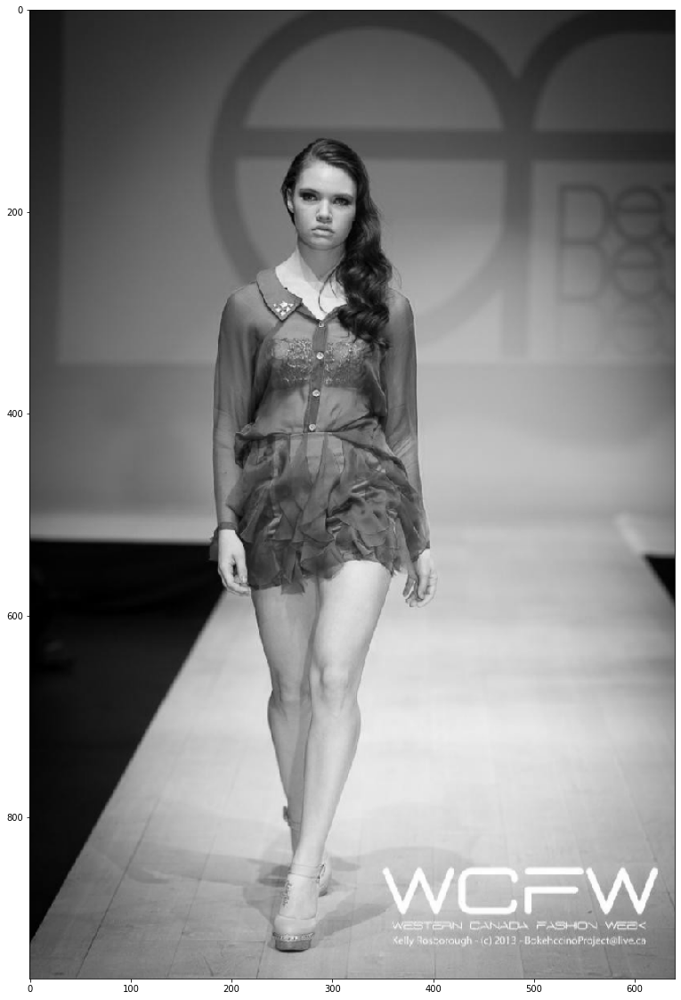

In [31]:
from detectron2.utils.visualizer import ColorMode
plt.figure(figsize=(20,20))
for d in random.sample(materialist_dict, 3):    
    im = cv2.imread(d["file_name"])
    outputs = predictor_FPN(im)
    visualizer = Visualizer(im[:, :, ::-1],
                   metadata=materialist_metadata, 
                   scale=0.8, 
                   instance_mode=ColorMode.IMAGE_BW   # remove the colors of unsegmented pixels
    )
    v = visualizer.draw_instance_predictions(outputs["instances"].to("cpu"))
    plt.imshow(v.get_image()[:, :, ::-1])


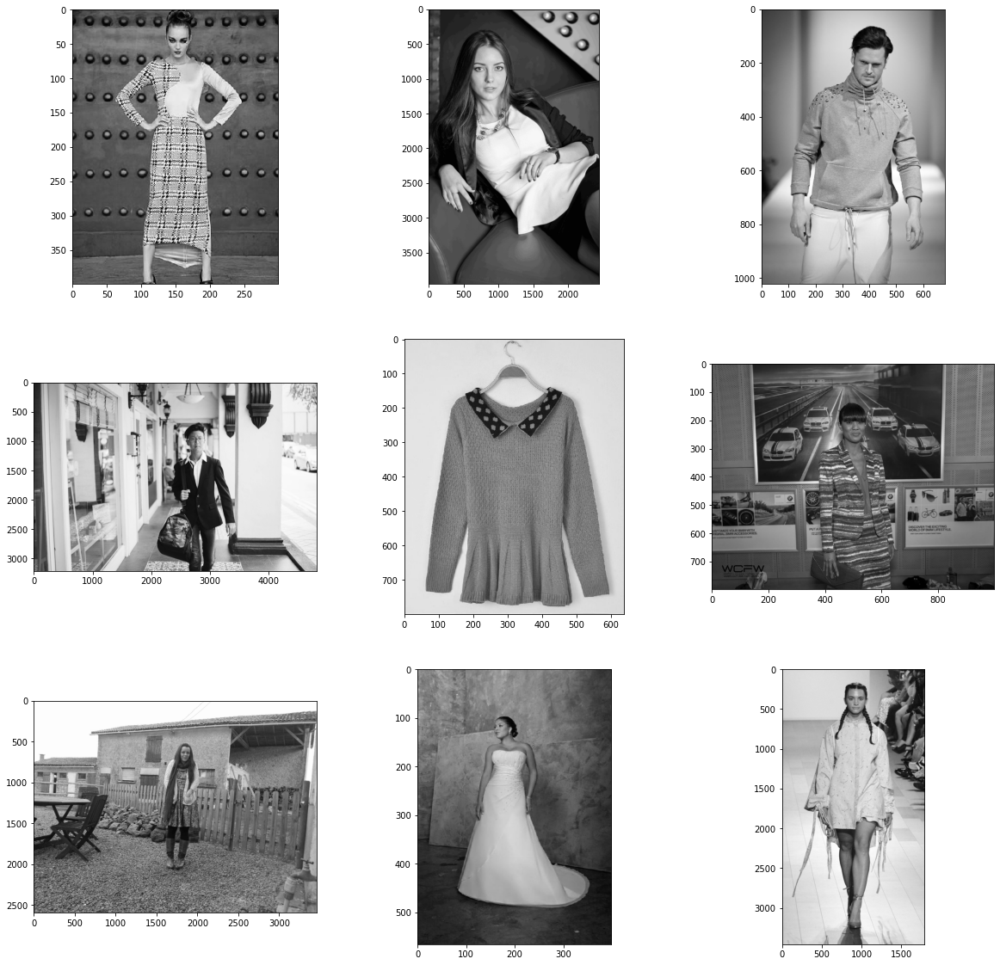

In [32]:
from detectron2.utils.visualizer import ColorMode

# Show different images at random
rows, cols = 3, 3
plt.figure(figsize=(20,20))

for i, d in enumerate(random.sample(materialist_dict, 9)):
    # Process image
    plt.subplot(rows, cols, i+1)

    im = cv2.imread(d["file_name"])
    im = cv2.cvtColor(im, cv2.COLOR_BGR2RGB)
    
    # Run through predictor
    outputs = predictor_FPN(im)
    
    # Visualize
    v = Visualizer(im[:, :, ::-1],
                   metadata=materialist_metadata, 
                   scale=0.8, 
                   instance_mode=ColorMode.IMAGE_BW   # remove the colors of unsegmented pixels
    )
    v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    plt.imshow(v.get_image()[:, :, ::-1])

plt.show()

In [33]:
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader

# Evaluate model
evaluator_FPN = COCOEvaluator("mat_val", output_dir="./output")
val_loader_FPN = build_detection_test_loader(cfg_FPN, "mat_val")

[11/19 14:23:07 d2.evaluation.coco_evaluation]: Trying to convert 'mat_val' to COCO format ...
[11/19 14:23:07 d2.data.datasets.coco]: Converting annotations of dataset 'mat_val' to COCO format ...)
0
[11/19 14:23:28 d2.data.datasets.coco]: Converting dataset dicts into COCO format
[11/19 14:23:28 d2.data.datasets.coco]: Conversion finished, #images: 64, #annotations: 500
[11/19 14:23:28 d2.data.datasets.coco]: Caching COCO format annotations at './output/mat_val_coco_format.json' ...
0
[11/19 14:23:52 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[11/19 14:23:52 d2.data.common]: Serializing the dataset using: <class 'detectron2.data.common.NumpySerializedList'>
[11/19 14:23:52 d2.data.common]: Serializing 64 elements to byte tensors and concatenating them all ...
[11/19 14:23:52 d2.data.common]: Serialized dataset takes 2.00 MiB


In [34]:
# Get results
result_FPN = inference_on_dataset(predictor_FPN.model, val_loader_FPN, evaluator_FPN)

[11/19 14:23:56 d2.evaluation.evaluator]: Start inference on 64 batches
[11/19 14:24:05 d2.evaluation.evaluator]: Inference done 11/64. Dataloading: 0.6451 s/iter. Inference: 0.0993 s/iter. Eval: 0.0001 s/iter. Total: 0.7445 s/iter. ETA=0:00:39
[11/19 14:24:10 d2.evaluation.evaluator]: Inference done 17/64. Dataloading: 0.6875 s/iter. Inference: 0.1041 s/iter. Eval: 0.0001 s/iter. Total: 0.7919 s/iter. ETA=0:00:37
[11/19 14:24:15 d2.evaluation.evaluator]: Inference done 22/64. Dataloading: 0.7858 s/iter. Inference: 0.1090 s/iter. Eval: 0.0001 s/iter. Total: 0.8952 s/iter. ETA=0:00:37
[11/19 14:24:20 d2.evaluation.evaluator]: Inference done 27/64. Dataloading: 0.8121 s/iter. Inference: 0.1098 s/iter. Eval: 0.0001 s/iter. Total: 0.9222 s/iter. ETA=0:00:34
[11/19 14:24:26 d2.evaluation.evaluator]: Inference done 34/64. Dataloading: 0.7755 s/iter. Inference: 0.1088 s/iter. Eval: 0.0001 s/iter. Total: 0.8847 s/iter. ETA=0:00:26
[11/19 14:24:31 d2.evaluation.evaluator]: Inference done 41/64.

In [35]:
result_FPN

OrderedDict([('bbox',
              {'AP': nan,
               'AP50': nan,
               'AP75': nan,
               'APs': nan,
               'APm': nan,
               'APl': nan})])

## DC5

In [38]:
from detectron2.engine import DefaultTrainer
os.environ["CUDA_LAUNCH_BLOCKING"] = "1"

# Fine-tune a COCO-pretrained R50-DC5 Mask R-CNN model on the dataset
cfg_DC5 = get_cfg()
cfg_DC5.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_DC5_3x.yaml"))
cfg_DC5.DATASETS.TRAIN = ("mat_train",)
cfg_DC5.DATASETS.TEST = ()
cfg_DC5.DATALOADER.NUM_WORKERS = 1
cfg_DC5.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_50_DC5_3x.yaml")
cfg_DC5.SOLVER.IMS_PER_BATCH = 2
cfg_DC5.SOLVER.BASE_LR = 0.00025  
cfg_DC5.SOLVER.MAX_ITER = 10
cfg_DC5.SOLVER.STEPS = []    
cfg_DC5.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128  
cfg_DC5.MODEL.ROI_HEADS.NUM_CLASSES = 46  

# Train
cfg_DC5.OUTPUT_DIR = "./output_DC5"
os.makedirs(cfg_DC5.OUTPUT_DIR, exist_ok=True)
trainer_DC5 = DefaultTrainer(cfg_DC5) 
trainer_DC5.resume_or_load(resume=False)
trainer_DC5.train()

[11/19 14:36:06 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): ResNet(
    (stem): BasicStem(
      (conv1): Conv2d(
        3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
        (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
      )
    )
    (res2): Sequential(
      (0): BottleneckBlock(
        (shortcut): Conv2d(
          64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=256, eps=1e-05)
        )
        (conv1): Conv2d(
          64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
        (conv2): Conv2d(
          64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
        (conv3): Conv2d(
          64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=256, eps=1e-05)
 

roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, weight}
roi_heads.mask_head.predictor.{bias, weight}


[11/19 14:41:56 d2.engine.train_loop]: Starting training from iteration 0
[11/19 14:42:22 d2.utils.events]:  eta: 0:00:00  iter: 9  total_loss: 5.877  loss_cls: 3.867  loss_box_reg: 0.8065  loss_mask: 0.6921  loss_rpn_cls: 0.3798  loss_rpn_loc: 0.1915  time: 1.7937  data_time: 1.1436  lr: 0.00022503  max_mem: 5757M
[11/19 14:42:22 d2.engine.hooks]: Overall training speed: 8 iterations in 0:00:14 (1.7937 s / it)
[11/19 14:42:22 d2.engine.hooks]: Total training time: 0:00:21 (0:00:07 on hooks)


In [39]:
cfg_DC5.MODEL.WEIGHTS = os.path.join(cfg_DC5.OUTPUT_DIR, "model_final.pth")
cfg_DC5.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5   # set the testing threshold for this model
cfg_DC5.DATASETS.TEST = ('mat_val')
predictor_DC5 = DefaultPredictor(cfg_DC5)

[11/19 14:42:35 d2.checkpoint.c2_model_loading]: Following weights matched with model:
| Names in Model                                  | Names in Checkpoint                                                                        | Shapes                                          |
|:------------------------------------------------|:-------------------------------------------------------------------------------------------|:------------------------------------------------|
| backbone.res2.0.conv1.*                         | backbone.res2.0.conv1.{norm.bias,norm.running_mean,norm.running_var,norm.weight,weight}    | (64,) (64,) (64,) (64,) (64,64,1,1)             |
| backbone.res2.0.conv2.*                         | backbone.res2.0.conv2.{norm.bias,norm.running_mean,norm.running_var,norm.weight,weight}    | (64,) (64,) (64,) (64,) (64,64,3,3)             |
| backbone.res2.0.conv3.*                         | backbone.res2.0.conv3.{norm.bias,norm.running_mean,norm.running_var,norm.weight,w

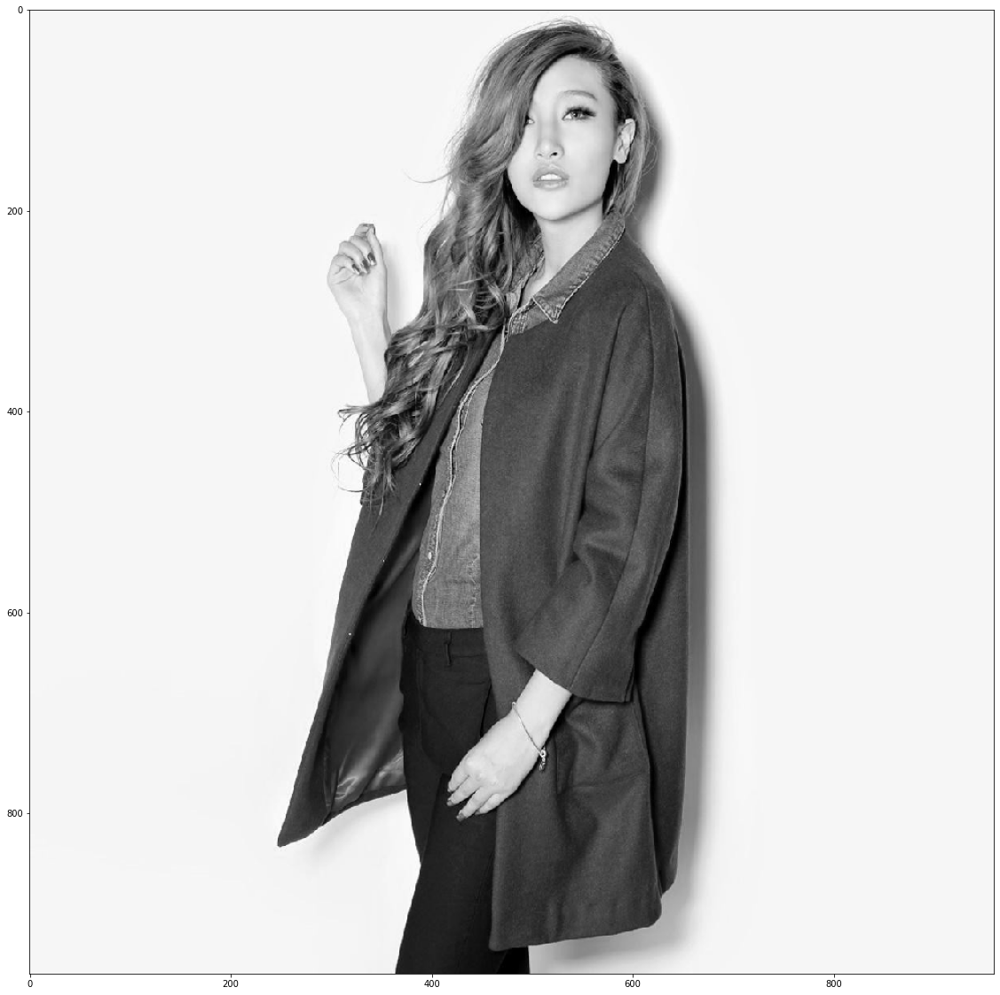

In [40]:
from detectron2.utils.visualizer import ColorMode
plt.figure(figsize=(20,20))
for d in random.sample(materialist_dict, 3):    
    im = cv2.imread(d["file_name"])
    outputs = predictor_DC5(im)
    visualizer = Visualizer(im[:, :, ::-1],
                   metadata=materialist_metadata, 
                   scale=0.8, 
                   instance_mode=ColorMode.IMAGE_BW   # remove the colors of unsegmented pixels
    )
    v = visualizer.draw_instance_predictions(outputs["instances"].to("cpu"))
    plt.imshow(v.get_image()[:, :, ::-1])

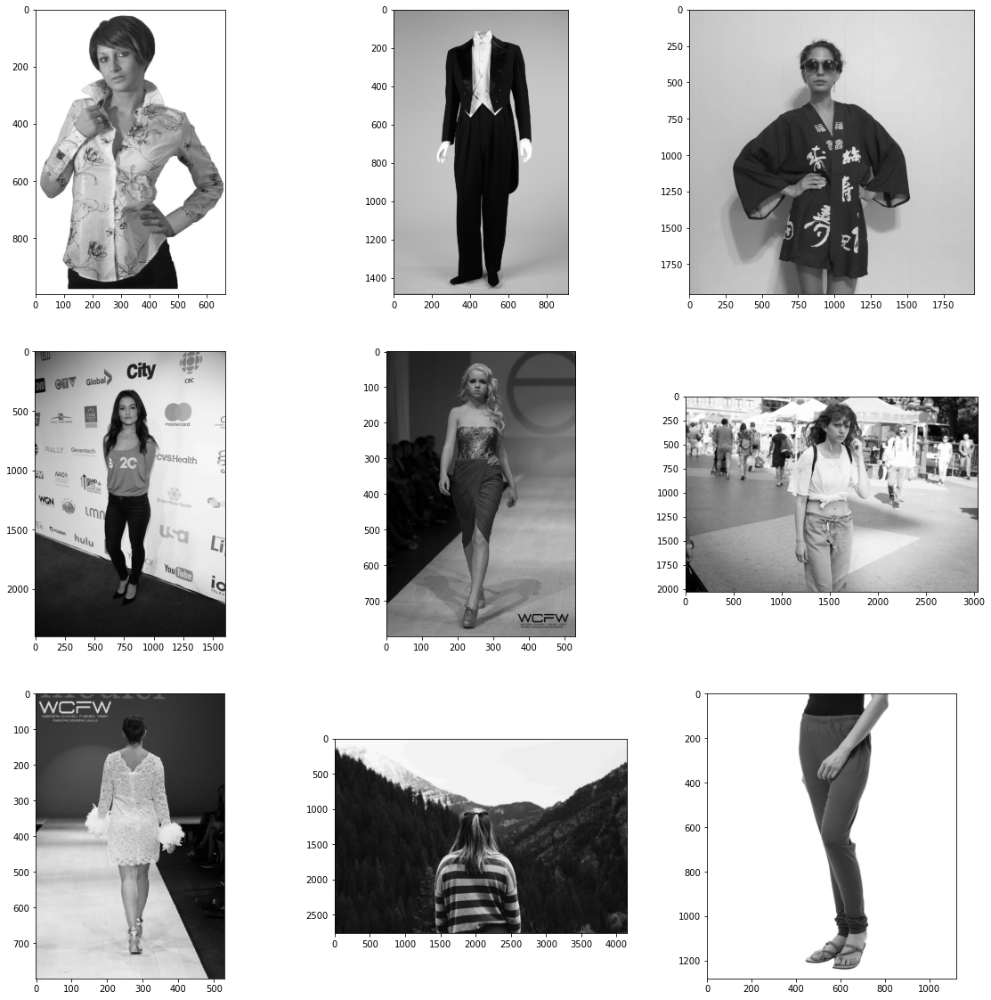

In [41]:
# Show different images at random
rows, cols = 3, 3
plt.figure(figsize=(20,20))
for i, d in enumerate(random.sample(materialist_dict, 9)):
    # Process image
    plt.subplot(rows, cols, i+1)
    im = cv2.imread(d["file_name"])
    im = cv2.cvtColor(im, cv2.COLOR_BGR2RGB)
    
    # Run through predictor
    outputs = predictor_DC5(im)
    
    # Visualize
    v = Visualizer(im[:, :, ::-1],
                   metadata=materialist_metadata, 
                   scale=0.8, 
                   instance_mode=ColorMode.IMAGE_BW   # remove the colors of unsegmented pixels
    )
    v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    plt.imshow(v.get_image()[:, :, ::-1])
plt.show()

In [42]:
# Evaluate model
evaluator_DC5 = COCOEvaluator("mat_val", output_dir=cfg_DC5.OUTPUT_DIR)
val_loader_DC5 = build_detection_test_loader(cfg_DC5, "mat_val")
result_DC5 = inference_on_dataset(predictor_DC5.model, val_loader_DC5, evaluator_DC5)

0
[11/19 14:43:55 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[11/19 14:43:55 d2.data.common]: Serializing the dataset using: <class 'detectron2.data.common.NumpySerializedList'>
[11/19 14:43:55 d2.data.common]: Serializing 64 elements to byte tensors and concatenating them all ...
[11/19 14:43:55 d2.data.common]: Serialized dataset takes 2.00 MiB
[11/19 14:43:55 d2.evaluation.evaluator]: Start inference on 64 batches
[11/19 14:43:58 d2.evaluation.evaluator]: Inference done 11/64. Dataloading: 0.0947 s/iter. Inference: 0.1721 s/iter. Eval: 0.0001 s/iter. Total: 0.2669 s/iter. ETA=0:00:14
[11/19 14:44:04 d2.evaluation.evaluator]: Inference done 25/64. Dataloading: 0.1763 s/iter. Inference: 0.1793 s/iter. Eval: 0.0001 s/iter. Total: 0.3560 s/iter. ETA=0:00:13
[11/19 14:44:09 d2.evaluation.evaluator]: Inference done 38/64. Dataloading: 0.1936 s/iter. Inference: 0.1789 s/i

In [43]:
result_DC5

OrderedDict([('bbox',
              {'AP': nan,
               'AP50': nan,
               'AP75': nan,
               'APs': nan,
               'APm': nan,
               'APl': nan})])

## C4

In [44]:
from detectron2.engine import DefaultTrainer

# Fine-tune a COCO-pretrained R50-C4 Mask R-CNN model on the dataset
cfg_C4 = get_cfg()
cfg_C4.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_C4_3x.yaml"))
cfg_C4.DATASETS.TRAIN = ("mat_train",)
cfg_C4.DATASETS.TEST = ()
cfg_C4.DATALOADER.NUM_WORKERS = 2
cfg_C4.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_50_C4_3x.yaml")
cfg_C4.SOLVER.IMS_PER_BATCH = 2
cfg_C4.SOLVER.BASE_LR = 0.00025
cfg_C4.SOLVER.MAX_ITER = 10
cfg_C4.SOLVER.STEPS = []
cfg_C4.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128
cfg_C4.MODEL.ROI_HEADS.NUM_CLASSES = 46

# Train
cfg_C4.OUTPUT_DIR = "./output_C4"
os.makedirs(cfg_C4.OUTPUT_DIR, exist_ok=True)
trainer_C4 = DefaultTrainer(cfg_C4) 
trainer_C4.resume_or_load(resume=False)
trainer_C4.train()

[11/19 14:44:33 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): ResNet(
    (stem): BasicStem(
      (conv1): Conv2d(
        3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
        (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
      )
    )
    (res2): Sequential(
      (0): BottleneckBlock(
        (shortcut): Conv2d(
          64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=256, eps=1e-05)
        )
        (conv1): Conv2d(
          64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
        (conv2): Conv2d(
          64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
        (conv3): Conv2d(
          64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=256, eps=1e-05)
 

model_final_4ce675.pkl: 144MB [00:12, 11.6MB/s]                           
roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, weight}
roi_heads.mask_head.predictor.{bias, weight}


[11/19 14:51:03 d2.engine.train_loop]: Starting training from iteration 0
[11/19 14:51:15 d2.utils.events]:  eta: 0:00:00  iter: 9  total_loss: 5.883  loss_cls: 3.753  loss_box_reg: 0.904  loss_mask: 0.6924  loss_rpn_cls: 0.3885  loss_rpn_loc: 0.1931  time: 0.9473  data_time: 0.5211  lr: 0.00022503  max_mem: 6260M
[11/19 14:51:15 d2.engine.hooks]: Overall training speed: 8 iterations in 0:00:07 (0.9473 s / it)
[11/19 14:51:15 d2.engine.hooks]: Total training time: 0:00:08 (0:00:01 on hooks)


In [45]:
# Create predictor from the weigths obtained during the training
cfg_C4.MODEL.WEIGHTS = os.path.join(cfg_C4.OUTPUT_DIR, "model_final.pth")
cfg_C4.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5
cfg_C4.DATASETS.TEST = ('mat_val')
predictor_C4 = DefaultPredictor(cfg_C4)

[11/19 14:51:26 d2.checkpoint.c2_model_loading]: Following weights matched with model:
| Names in Model                                  | Names in Checkpoint                                                                         | Shapes                                          |
|:------------------------------------------------|:--------------------------------------------------------------------------------------------|:------------------------------------------------|
| backbone.res2.0.conv1.*                         | backbone.res2.0.conv1.{norm.bias,norm.running_mean,norm.running_var,norm.weight,weight}     | (64,) (64,) (64,) (64,) (64,64,1,1)             |
| backbone.res2.0.conv2.*                         | backbone.res2.0.conv2.{norm.bias,norm.running_mean,norm.running_var,norm.weight,weight}     | (64,) (64,) (64,) (64,) (64,64,3,3)             |
| backbone.res2.0.conv3.*                         | backbone.res2.0.conv3.{norm.bias,norm.running_mean,norm.running_var,norm.weig

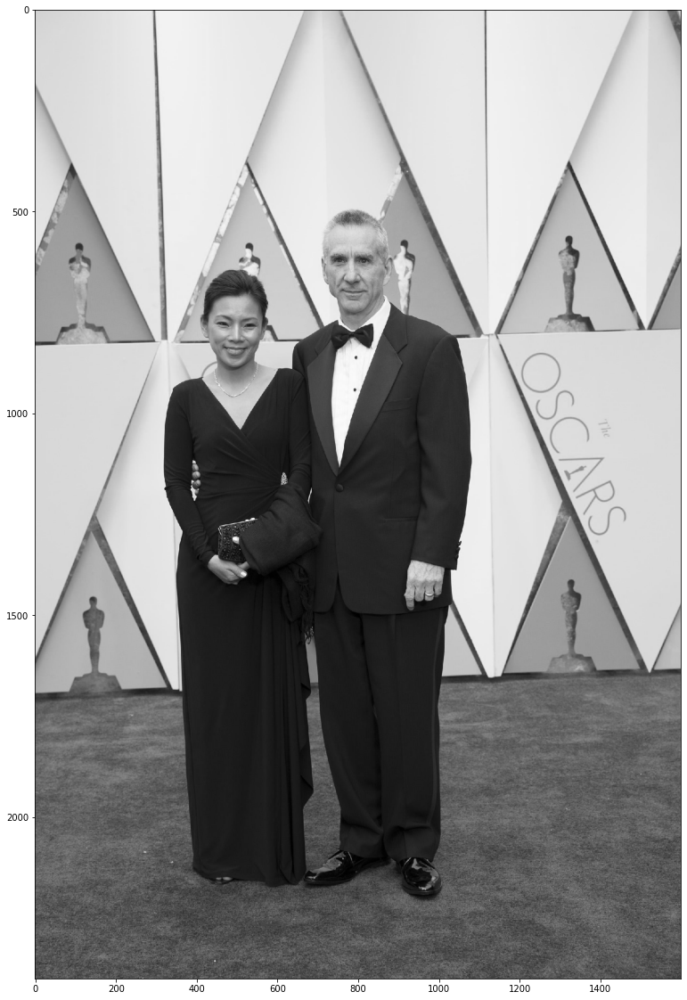

In [46]:
from detectron2.utils.visualizer import ColorMode
plt.figure(figsize=(20,20))
for d in random.sample(materialist_dict, 3):    
    im = cv2.imread(d["file_name"])
    outputs = predictor_C4(im)
    visualizer = Visualizer(im[:, :, ::-1],
                   metadata=materialist_metadata, 
                   scale=0.8, 
                   instance_mode=ColorMode.IMAGE_BW   # remove the colors of unsegmented pixels
    )
    v = visualizer.draw_instance_predictions(outputs["instances"].to("cpu"))
    plt.imshow(v.get_image()[:, :, ::-1])

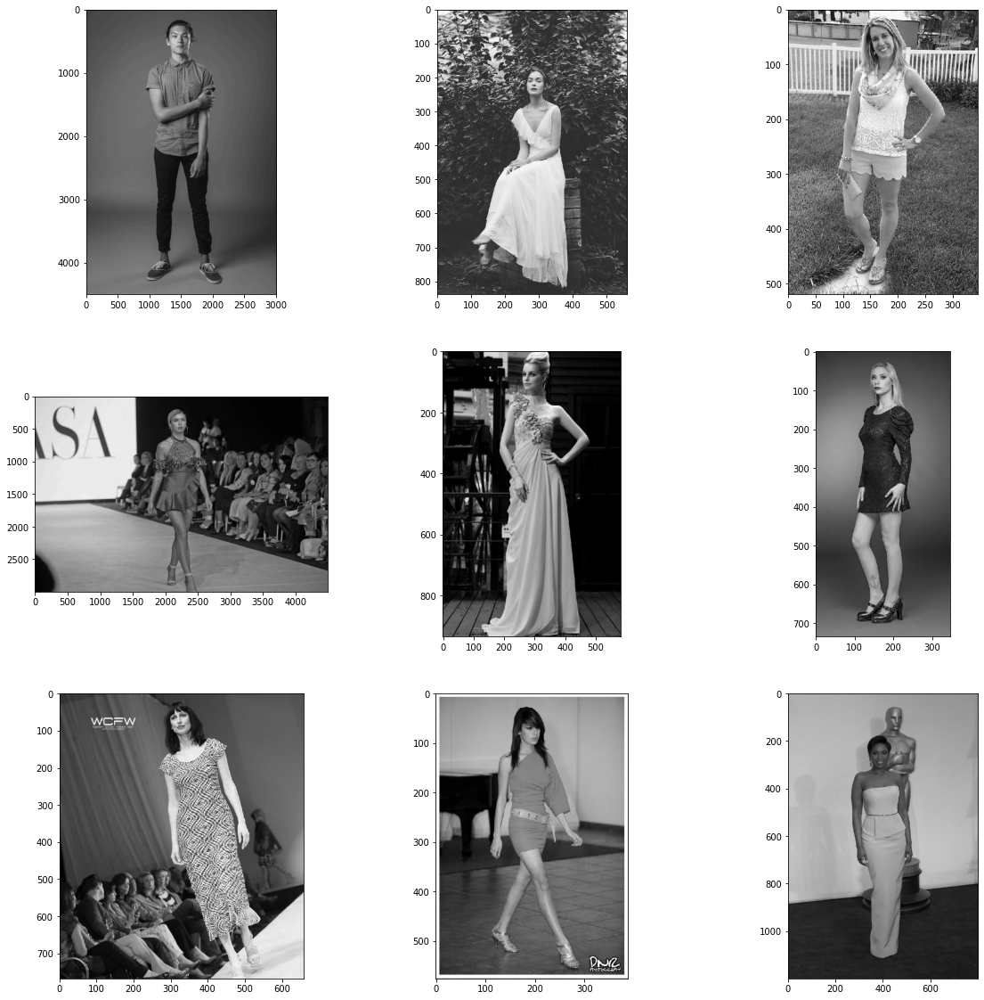

In [47]:
# Show different images at random
rows, cols = 3, 3
plt.figure(figsize=(20,20))
for i, d in enumerate(random.sample(materialist_dict, 9)):
    # Process image
    plt.subplot(rows, cols, i+1)
    im = cv2.imread(d["file_name"])
    im = cv2.cvtColor(im, cv2.COLOR_BGR2RGB)
    
    # Run through predictor
    outputs = predictor_C4(im)
    
    # Visualize
    v = Visualizer(im[:, :, ::-1],
                   metadata=materialist_metadata, 
                   scale=0.8, 
                   instance_mode=ColorMode.IMAGE_BW   # remove the colors of unsegmented pixels
    )
    v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    plt.imshow(v.get_image()[:, :, ::-1])
plt.show()

In [48]:
# Evaluate model
evaluator_C4 = COCOEvaluator("mat_val", output_dir="./output")
val_loader_C4 = build_detection_test_loader(cfg_C4, "mat_val")
result_C4 = inference_on_dataset(predictor_C4.model, val_loader_C4, evaluator_C4)

0
[11/19 14:52:48 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[11/19 14:52:48 d2.data.common]: Serializing the dataset using: <class 'detectron2.data.common.NumpySerializedList'>
[11/19 14:52:48 d2.data.common]: Serializing 64 elements to byte tensors and concatenating them all ...
[11/19 14:52:49 d2.data.common]: Serialized dataset takes 2.00 MiB
[11/19 14:52:49 d2.evaluation.evaluator]: Start inference on 64 batches
[11/19 14:52:52 d2.evaluation.evaluator]: Inference done 11/64. Dataloading: 0.0246 s/iter. Inference: 0.2000 s/iter. Eval: 0.0001 s/iter. Total: 0.2247 s/iter. ETA=0:00:11
[11/19 14:52:57 d2.evaluation.evaluator]: Inference done 25/64. Dataloading: 0.1069 s/iter. Inference: 0.2150 s/iter. Eval: 0.0005 s/iter. Total: 0.3228 s/iter. ETA=0:00:12
[11/19 14:53:02 d2.evaluation.evaluator]: Inference done 39/64. Dataloading: 0.1252 s/iter. Inference: 0.2139 s/i

In [49]:
result_C4

OrderedDict([('bbox',
              {'AP': nan,
               'AP50': nan,
               'AP75': nan,
               'APs': nan,
               'APm': nan,
               'APl': nan})])

# Evaluation

In [50]:
results_dict = {}

# Create table to compare results
results_dict['bbox_DC5'] = result_DC5['bbox']
results_dict['bbox_C4'] = result_C4['bbox']
results_dict['bbox_FPN'] = result_FPN['bbox']
results_dict['segm_DC5'] = result_DC5['segm']
results_dict['segm_C4'] = result_C4['segm']
results_dict['segm_FPN'] = result_FPN['segm']

df_results = pd.DataFrame.from_dict(results_dict)
df_results.loc[['AP', 'AP50', 'AP75', 'APs', 'APm', 'APl']]

KeyError: ignored

In [51]:
import ast

metrics = {}

# Create losses plots
for folder in ["FPN", "C4", "DC5"]:
    with open(f'output_{folder}/metrics.json') as file:
        lines = file.readlines()
    
    metrics_model = []
    for line in lines:
        metrics_model.append(ast.literal_eval(line))
    metrics[folder] = metrics_model

KeyError: ignored

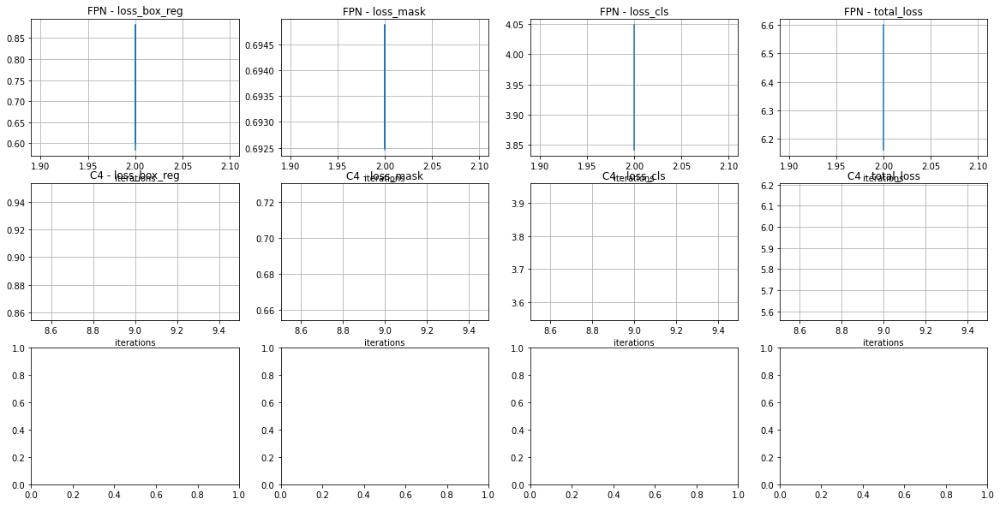

In [52]:
import matplotlib.pyplot as plt

fig, axs = plt.subplots(3, 4, figsize=(20,10))

for idx, model in enumerate(["FPN", "C4", "DC5"]):
    met = metrics[model]
    for loss_id, loss in enumerate(["loss_box_reg", "loss_mask", "loss_cls", "total_loss"]):
        ax = axs[idx, loss_id]
        total_loss = [loss_dict[loss] for loss_dict in met]
        iterations = [loss_dict['iteration'] for loss_dict in met]

        ax.set_title(f"{model} - {loss}")
        ax.set_xlabel("iterations")
        ax.plot(iterations, total_loss)
        ax.grid()
        
fig.tight_layout()